### ESN application: Layer-wise relevance propagation baseESN on ENSO

Inspired by [Toms et al, 2020](https://agupubs.onlinelibrary.wiley.com/doi/full/10.1029/2019MS002002) paper "Physically Interpretable Neural Networks for the Geosciences: Applications to Earth System Variability", we want to reproduce some of their results, but with baseESN models.

#### Data and derived sst anomaly index

SST data: https://downloads.psl.noaa.gov/Datasets/noaa.ersst.v5/sst.mnmean.nc

Data contains **monthly mean SST** from 1854 .. 2021, in a 2° by 2° lat/lon grid:  
**lat:** 88N .. -88N (= 88S)  
**lon:** 0E .. 358E

Start from 1880. Following https://climatedataguide.ucar.edu/climate-data/nino-sst-indices-nino-12-3-34-4-oni-and-tni and using the NINO3.4 box, we can diagnose the El-Nino-Southern-Oscillation Index (ENSO) from sea-surface temperature (SST). However, recipe for calculating ENSO requires some rolling mean. We omit the rolling mean here and directly take **sst anomaly index** instead.

#### Outline

- Calculate sst anomaly index
- Classify sst anomaly fields: El Nino / La Nina
- Try linear regression and baseESN for comparison (**--> see first part in notebook: ESN_exp08_LRP.ipynb**)
- Optimize baseESN (hyper-)parameters (**--> see first part in notebook: ESN_exp08_LRP.ipynb**)
- Then try layer-wise relevance propagation, with MLP and baseESN (**--> see second part in notebook: ESN_exp08_LRP_part2.ipynb**)
- Try to optimize LRP with baseESN on continuous single target.

#### Sources

Google search results for "ESN for image classification" led to some promising papers:

* [Echo State Networks-based Reservoir Computing for MNIST Handwritten Digits Recognition](https://www.researchgate.net/figure/Inputs-and-outputs-of-a-ESN-for-image-classification-with-N-i-28_fig2_309033779)
* [On the Post-hoc Explainability of Deep Echo State Networks for Time Series Forecasting, Image and Video Classification](https://arxiv.org/abs/2102.08634) from Feb 2021
* [A Reservoir Computing approach to Image Classification using Coupled Echo State and Back-Propagation Neural Networks](https://www.sacral.c.u-tokyo.ac.jp/pdf/woodward_ivcnz_2011.pdf).
* [An image classification method based on Echo State Network](https://ieeexplore.ieee.org/document/9607999) from Nov 2021 (for purchase!)

### Tech preamble

In [1]:
import xarray as xr
import numpy as np
from matplotlib import pyplot as plt
from statsmodels.tsa.stattools import adfuller
from scipy.special import softmax, expit

import tensorflow as tf
from tensorflow.keras import Sequential
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, Lambda, concatenate, Conv1D, LSTM, BatchNormalization, LeakyReLU
from tensorflow.keras.optimizers import Adam, SGD
import tensorflow.keras.initializers as tfi
import tensorflow.keras.regularizers as tfr
from tensorflow.keras.utils import plot_model

import hvplot.xarray
import matplotlib.patches as patches

### Work with my own library of useful ESN functions

## When zero input and reservoir biases are required:
#from ESN_functions_v04_nobias import * 

## Oterwise work with randomly initialized input and reservoir biases:
from ESN_functions_v04 import * 

### Load SST data

In [2]:
# Use, when working with relative path on local machine (or nesh)
sst_path = "../data/sst.mnmean.nc"
sst_dataset = xr.open_dataset(sst_path)
sst_dataset

<xarray.Dataset>
Dimensions:    (lat: 89, lon: 180, time: 2015, nbnds: 2)
Coordinates:
  * lat        (lat) float32 88.0 86.0 84.0 82.0 ... -82.0 -84.0 -86.0 -88.0
  * lon        (lon) float32 0.0 2.0 4.0 6.0 8.0 ... 352.0 354.0 356.0 358.0
  * time       (time) datetime64[ns] 1854-01-01 1854-02-01 ... 2021-11-01
Dimensions without coordinates: nbnds
Data variables:
    time_bnds  (time, nbnds) float64 ...
    sst        (time, lat, lon) float32 ...
Attributes: (12/37)
    climatology:               Climatology is based on 1971-2000 SST, Xue, Y....
    description:               In situ data: ICOADS2.5 before 2007 and NCEP i...
    keywords_vocabulary:       NASA Global Change Master Directory (GCMD) Sci...
    keywords:                  Earth Science > Oceans > Ocean Temperature > S...
    instrument:                Conventional thermometers
    source_comment:            SSTs were observed by conventional thermometer...
    ...                        ...
    creator_url_original:      https://www.ncei.noaa.gov
    license:                   No constraints on data access or use
    comment:                   SSTs were observed by conventional thermometer...
    summary:                   ERSST.v5 is developed based on v4 after revisi...
    dataset_title:             NOAA Extended Reconstructed SST V5
    data_modified:             2021-12-06

### Calculating SST anomaly index from sst data

There are several indices used to monitor the tropical Pacific, all of which are based on SST anomalies averaged across a given region.  Usually the anomalies are computed relative to a base period of 30 years.  The Niño 3.4 index is one of the most commonly used indices to define El Niño and La Niña events.

Website https://climatedataguide.ucar.edu/climate-data/nino-sst-indices-nino-12-3-34-4-oni-and-tni gives introduction to ENSO indices. Paper [Morrow et al., 2010] shows index for Niño 3.4 region (5°N–5°S, 120–170°W) in the tropical Pacific. The website references a link to an "expert guide" with more detailed information and a recipe on calculating ENSO indices:

(...) Nino X Index computation: (a) Compute area averaged total SST from Niño X region; (b) Compute monthly climatology (here 1980-2009) for area averaged total SST from Niño X region, and subtract climatology from area averaged total SST time series to obtain anomalies; (c) Smooth the anomalies with a 5-month running mean; (d) Normalize the smoothed values by its standard deviation over the climatological period. (...)

**Note:** We omit smoothing with rolling mean here and hence call it *sst anomaly index* instead of *ENSO index*.

#### Former experiments on ENSO index / Various approaches of computing indices

In recent experiments we had trouble to classify sst anomaly fields with base ESN models. It turns out that a mistake in calculating sst anomaly index and sst anomaly fields had been done: Recipe for computing Nino index states in step (b) to get **monthly** climatology. This has not been done so far, but we have usually taken **total** climatology, neglecting variance in months. The effect is shown below: We start with calculating sst anomaly indices in different ways, to compare. We then end up with:

* **sst_anomaly_total_norm**: Use **total climatology** in step (b) and **total std. deviation** for normalizing in step (d).
* **sst_anomaly_monthly_norm**: Use **monthly climatology** in step (b) and **monthly std. deviation** for normalizing in step (d).
* **sst_anomaly_monthly_norm_alt**: Use **monthly climatology** in step (b) and **total std. deviation** for normalizing in step (d).

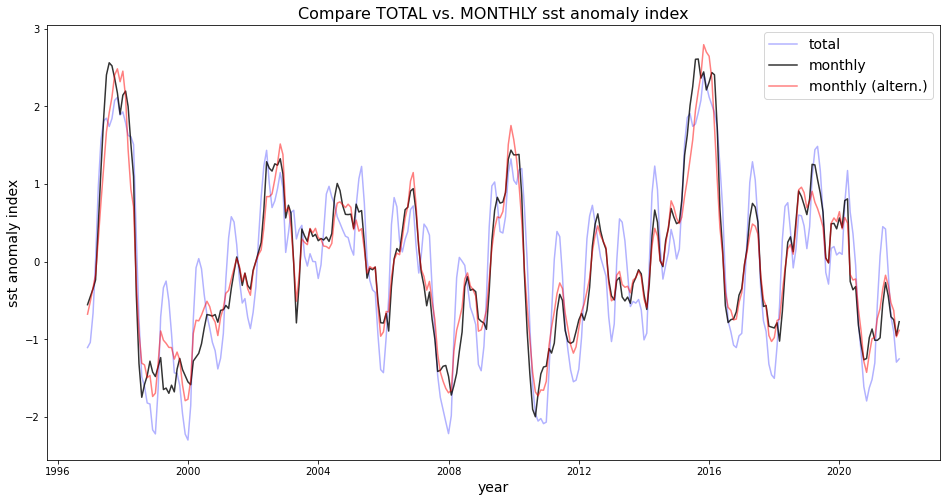

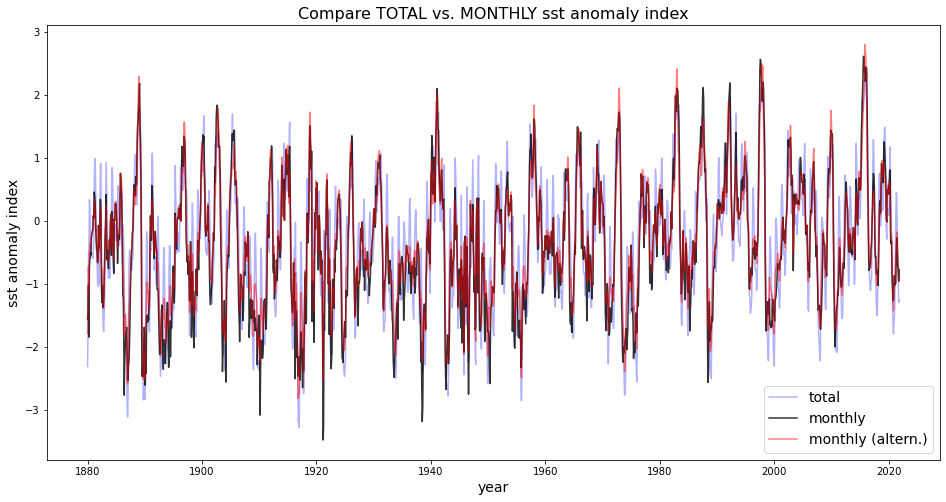

In [117]:
### Compute area averaged total SST from Niño 3.4 region (5°N–5°S, 120–170°W).
# Note: Since the box of interest is close to equator (5°N-5°S) we simply average over the box area and don't take care
# care of area weighting here.
# Note: latitude comes in a grid 88, 86, .., -86, 88, slice(5,-5) is actually using (4°N-4°S) only.
# Note: longitude ranges from 0 to 358°E. Region of interest (120-170°W) translates to (190°E-240°E) here.
sst_mean = (
    sst_dataset.sst.sel(time=slice('1880-01-01', '2021-11-01'))
    .sel(lat=slice(5,-5)).sel(lon=slice(190,240))
    .mean(("lat", "lon"))
)

# Compute total climatology (here: 1980-2009) for area averaged total SST from Niño 3.4 region.
# "Total" means taking average over ALL timesteps.
sst_climatology_total = (
    sst_dataset.sst
    .sel(time=slice('1980-01-01','2009-12-01'))
    .sel(lat=slice(5,-5))
    .sel(lon=slice(190,240))
    .mean(("lat", "lon", "time"))
)

# Compute monthly climatology (here: 1980-2009) for area averaged total SST from Niño 3.4 region.
# "Monthly" means grouping by month before calculating average over time.
sst_climatology_monthly = (
    sst_dataset.sst
    .sel(time=slice('1980-01-01','2009-12-01'))
    .sel(lat=slice(5,-5))
    .sel(lon=slice(190,240))
    .mean(("lat", "lon"))
    .groupby("time.month")
    .mean("time")    
)

# Compute std dev in time for total climatology (here: 1980-2009), 
# use area averaged total SST from Niño 3.4 region
sst_climatology_total_std = (
    sst_dataset.sst
    .sel(time=slice('1980-01-01','2009-12-01'))
    .sel(lat=slice(5,-5))
    .sel(lon=slice(190,240))
    .mean(("lat", "lon"))
    .std("time")          
)

# Compute std dev in time for monthly climatology (here: 1980-2009), 
# use area averaged total SST from Niño 3.4 region
sst_climatology_monthly_std = (
    sst_dataset.sst
    .sel(time=slice('1980-01-01','2009-12-01'))
    .sel(lat=slice(5,-5))
    .sel(lon=slice(190,240))
    .mean(("lat", "lon"))
    .groupby("time.month")
    .std("time")          
)

# Subtract total climatology from area averaged total SST time series to obtain anomalies
sst_anomaly_total = sst_mean - sst_climatology_total

# Subtract monthly climatology from area averaged total SST time series to obtain anomalies
sst_anomaly_monthly = sst_mean.groupby("time.month") - sst_climatology_monthly

# ENSO index is calculated as 5 months rolling mean of sst anomaly.
# We aim to label time sclices of lat/lon grids according to their phase: "El Nino" / "La Nina".
# This requires sst_anomaly WITHOUT rolling mean!
# But still normalize sst anomaly by dividing by standard deviation of sst climatology, as done for ENSO index:
sst_anomaly_total_norm = sst_anomaly_total / sst_climatology_total_std
sst_anomaly_monthly_norm = sst_anomaly_monthly.groupby("time.month") / sst_climatology_monthly_std
sst_anomaly_monthly_norm_alt = sst_anomaly_monthly / sst_climatology_total_std

# LAST 300 timesteps (=months): Plot total vs. monthly normalized sst anomaly indices
plt.figure(figsize=(16,8))
plt.plot(sst_anomaly_total_norm.time[-300:],sst_anomaly_total_norm.values[-300:],'b',label="total", alpha=0.3)
plt.plot(sst_anomaly_monthly_norm.time[-300:],sst_anomaly_monthly_norm.values[-300:],'k',label="monthly", alpha=0.8)
plt.plot(sst_anomaly_monthly_norm_alt.time[-300:],sst_anomaly_monthly_norm_alt.values[-300:],'r',label="monthly (altern.)", alpha=0.5)
plt.title('Compare TOTAL vs. MONTHLY sst anomaly index', fontsize=16)
plt.xlabel('year', fontsize=14)
plt.ylabel('sst anomaly index', fontsize=14)
plt.legend(fontsize=14)
plt.show()

# FULL timespan: Plot total vs. monthly normalized sst anomaly indices
plt.figure(figsize=(16,8))
plt.plot(sst_anomaly_total_norm.time,sst_anomaly_total_norm.values,'b',label="total", alpha=0.3)
plt.plot(sst_anomaly_monthly_norm.time,sst_anomaly_monthly_norm.values,'k',label="monthly", alpha=0.8)
plt.plot(sst_anomaly_monthly_norm_alt.time,sst_anomaly_monthly_norm_alt.values,'r',label="monthly (altern.)", alpha=0.5)
plt.title('Compare TOTAL vs. MONTHLY sst anomaly index', fontsize=16)
plt.xlabel('year', fontsize=14)
plt.ylabel('sst anomaly index', fontsize=14)
plt.legend(fontsize=14)
plt.show()

# Pick index:
sst_anomaly_norm = sst_anomaly_monthly_norm_alt

trend parameters:  [ 3.80830543e-04 -6.57000607e-01]


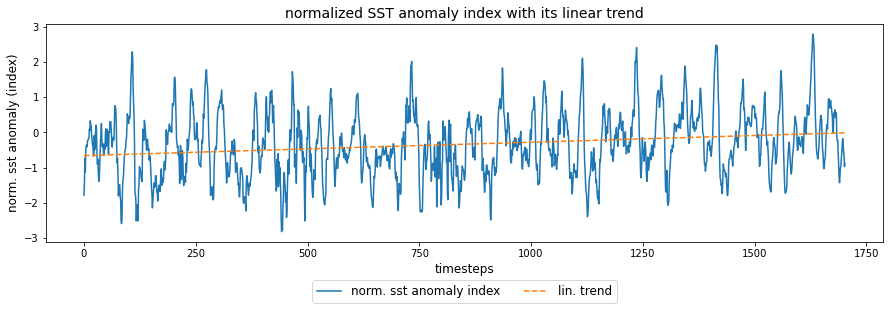

In [25]:
## OPTIONALLY: de-trending norm. sst anomaly index using first order polynomial fit, to remove linear trend.

# Get trend parameters from polyfit
x_index = np.array(range(len(sst_anomaly_norm.values)))
trend_param = np.polyfit(x_index, sst_anomaly_norm.values, 1)
print("trend parameters: ",trend_param)

# Restore trend from obtained trend parameters
trend = x_index*trend_param[0]+trend_param[1]

# Plot original timeseries (norm. sst anomaly index) together with linear trend
plt.figure(figsize=(15, 4))
plt.plot(range(len(sst_anomaly_norm.values)), sst_anomaly_norm.values, label='norm. sst anomaly index')
plt.xlabel('timesteps', fontsize=12)
plt.ylabel('norm. sst anomaly (index)', fontsize=12)
plt.plot(range(len(trend)), trend, linestyle='--', label='lin. trend')
plt.title('normalized SST anomaly index with its linear trend', fontsize=14)
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), fancybox=True, shadow=False, ncol=2, fontsize=12)
plt.show()

sst_anomaly_norm.values = sst_anomaly_norm.values - trend

### Discussion on computing sst anomaly index

Plotting the various indices we find a strong cycly in **sst_anomaly_total_norm** with period $T=12$ months, as a result of only subtracting **total climatology** in step (b). This appears to be *wrong*. We decide to stick closely to the original recipy for computing Nino indices and hence picked **sst_anomaly_monthly_norm_alt** for further investigation, renamed as **sst_anomaly_norm**.

Since we observe an up-trend over the time period, we could decide to **apply de-trending** with first order polynomial fit, to remove at least the linear trend and have rather balanced amount of El Nino and La Nina events.
However, this step is optional since we have a global warming trend and expect to find more El Nino conditions in recent years.

### Prepare inputs and targets

The same mistake that we have just discussed for computing sst anomaly index in former experiments, has been done for preparing input fields: We have subtracted **total climatology** fields, instead of **monthly climatology** fields.

This is now correctly done for preparing inputs we then use for **classification of sst anomaly fields** with **base ESN** models.

In [190]:
### Prepare inputs and targets for base ESN on sst anomaly fields

# Again get raw sst fields as lat/lon grids in time, from 1880 to date:
sst_fields = (
    sst_dataset.sst
    .sel(time=slice('1880-01-01', '2021-11-01'))
    #.sel(lat=slice(70,-65))#.sel(lon=slice(150,280))  ### Only, if we don't want to take whole worlds sst fields!
)

# Compute monthly climatology (here 1980 - 2009) for whole world
sst_climatology_fields = (
    sst_dataset.sst
    .sel(time=slice('1980-01-01','2009-12-01'))
    .groupby("time.month")
    .mean("time")
    #.sel(lat=slice(70,-65))#.sel(lon=slice(150,280))  ### Only, if we don't want to take whole worlds sst fields!
)

# Get sst anomaly fields by subtracting monthly climatology from raw sst fields:
sst_anomaly_fields = sst_fields.groupby("time.month") - sst_climatology_fields

# Only keep sst anomaly fields connected either El Nino or La Nina event.
sst_anomaly_fields_NinoNina = sst_anomaly_fields[(sst_anomaly_norm.values > 0.5) | (sst_anomaly_norm.values < -0.5)]

# Extract sst anomaly fields' values as iputs:
inputs = np.copy(sst_anomaly_fields_NinoNina.values)

# Replace nan values by ZERO
inputs[np.isnan(inputs)] = 0

# It might be a problem to first set nan values to zero, then apply min/max scaling.
# After scaling former nan values are non-zero!
# On the other hand we cannot get necessary min/max values as long as we have nan values.
# Solution: Replace nan by zero. Apply min/max scaling. Then again set former nan values to zero.

# Check how many nan values we have:
temp_isnan = np.isnan(sst_anomaly_fields_NinoNina.values)
temp_isnan_rel = sum(sum(sum(temp_isnan))) / (temp_isnan.shape[0] * temp_isnan.shape[1] * temp_isnan.shape[2])
print("rel. amount of nan values in inputs BEFORE modification: ", np.round(temp_isnan_rel,2))

# Get targets from sst anomaly index:
targets = sst_anomaly_norm.values[(sst_anomaly_norm.values > 0.5) | (sst_anomaly_norm.values < -0.5)]

# Also convert targets to binary targets (1 / 0) for El Nino / La Nina.
targets_bin = (targets > 0.5).astype(int)

# Reshape targets to (samples, 1):
targets = targets.reshape((len(targets), 1))
targets_bin = targets_bin.reshape((len(targets_bin), 1))

# Create one-hot targets for two unit output (El Nino / La Nina):
targets_onehot = np.concatenate([(targets_bin==1).astype(int),(targets_bin==0).astype(int)], axis=1)

## Split inputs and targets into train and validation data according to train_val_split.

# Set rel. amount of samples used for training:
train_val_split = 0.8

# Get number of train samples:
n_train = int(len(inputs) * train_val_split)

# get quantile min/max for for specified X% quantile on train data (year 2002..2015)
quantile_perc = 0.005 #e.g. 0.005 to cap 0.5% at lower AND upper edge of distribution
q_lower_limit = np.quantile(inputs.flatten(), quantile_perc)
q_upper_limit = np.quantile(inputs.flatten(), 1 - quantile_perc)

# Cap inputs with values outside quantile limits:
inputs[inputs > q_upper_limit] = q_upper_limit
inputs[inputs < q_lower_limit] = q_lower_limit

## Scale inputs to [-1,1] or [0,1] according to min/max obtained from only train inputs.

# Remenber min/max used for scaling.
train_min = np.min(inputs[:n_train])
train_max = np.max(inputs[:n_train])

# Scale to either [-1,1]:
#inputs = 2 * (inputs - train_min) / (train_max - train_min) - 1

# Alternatively scale inputs to [0,1]
inputs = (inputs - train_min) / (train_max - train_min)


# Again set former nan values to zero after scaling:
inputs = inputs * np.invert(temp_isnan)

# Split inputs and targets:
train_input = inputs[:n_train]
val_input = inputs[n_train:]
train_target = targets[:n_train]
val_target = targets[n_train:]
train_target_bin = targets_bin[:n_train]
val_target_bin = targets_bin[n_train:]
train_target_onehot = targets_onehot[:n_train]
val_target_onehot = targets_onehot[n_train:]

## Additionally scale targets to [-1,1] according to min/max obtained from only train targets.
# Remenber min/max used for scaling.
train_target_min = np.min(train_target)
train_target_max = np.max(train_target)
# Scale
train_target_scaled = 2 * (train_target - train_target_min) / (train_target_max - train_target_min) - 1
val_target_scaled = 2 * (val_target - train_target_min) / (train_target_max - train_target_min) - 1

# Dimensionality check:
print("\ninputs shape (all input samples): ", inputs.shape)
print("train_input shape: ", train_input.shape)
print("val_input shape: ", val_input.shape)
print("\ntargets shape (all targets): ", targets.shape)
print("train_target shape: ", train_target.shape)
print("val_target shape: ", val_target.shape)
print("train_target_onehot shape: ", train_target_onehot.shape)
print("val_target_onehot shape: ", val_target_onehot.shape)
print("\ntrain_inputs min: ", train_min)
print("train_inputs max: ", train_max)
print("\nscaled train_inputs min: ", np.min(train_input))
print("scaled train_inputs max: ", np.max(train_input))
print("scaled val_inputs min: ", np.min(val_input))
print("scaled val_inputs max: ", np.max(val_input))
print("\nun-scaled train_target min: ", np.min(train_target))
print("un-scaled train_target max: ", np.max(train_target))
print("un-scaled val_target min: ", np.min(val_target))
print("un-scaled val_target max: ", np.max(val_target))
print("\nscaled train_target min: ", np.min(train_target_scaled))
print("scaled train_target max: ", np.max(train_target_scaled))
print("scaled val_target min: ", np.min(val_target_scaled))
print("scaled val_target max: ", np.max(val_target_scaled))

rel. amount of nan values in inputs BEFORE modification:  0.31

inputs shape (all input samples):  (1039, 89, 180)
train_input shape:  (831, 89, 180)
val_input shape:  (208, 89, 180)

targets shape (all targets):  (1039, 1)
train_target shape:  (831, 1)
val_target shape:  (208, 1)
train_target_onehot shape:  (831, 2)
val_target_onehot shape:  (208, 2)

train_inputs min:  -2.2602541
train_inputs max:  1.6804371

scaled train_inputs min:  0.0
scaled train_inputs max:  1.0
scaled val_inputs min:  0.0
scaled val_inputs max:  1.0

un-scaled train_target min:  -2.8181634
un-scaled train_target max:  2.4123752
un-scaled val_target min:  -1.7919745
un-scaled val_target max:  2.7960107

scaled train_target min:  -1.0
scaled train_target max:  1.0
scaled val_target min:  -0.60761636
scaled val_target max:  1.1466906


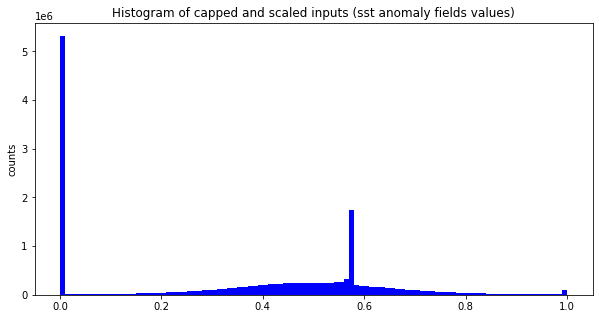

In [119]:
# Plot histogram of scaled inputs:
nBins = 100
fig, axes = plt.subplots(1, 1, figsize=(10,5))
axes.hist(inputs.flatten(), nBins, color="blue")
axes.set_ylabel("counts")
axes.set_title("Histogram of capped and scaled inputs (sst anomaly fields values)")
plt.show()

## Observe: Former nan values are set to zero. But where does that second peak come from?

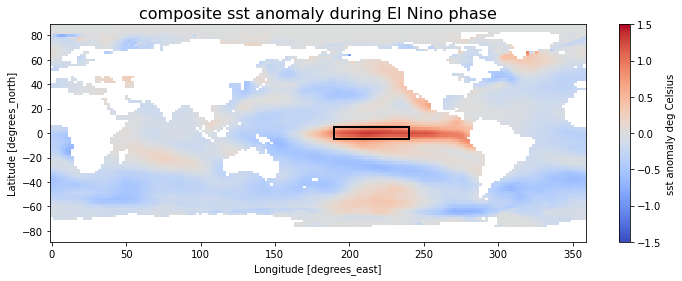

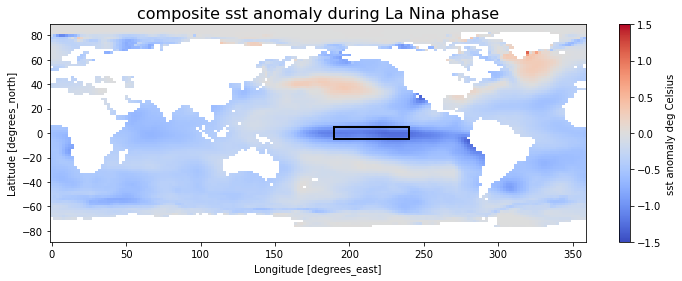

In [120]:
## Split sst anomaly fields related to El Nino or La Nina, respectively:

# El Nino
sst_anomaly_fields_ElNino = sst_anomaly_fields[(sst_anomaly_norm.values > 0.5)]

# La Nina
sst_anomaly_fields_LaNina = sst_anomaly_fields[(sst_anomaly_norm.values < -0.5)]

## Get mean sst anomaly field as composit of all sst fields belonging to either "El Nino" or "La Nina":

# El Nino
sst_anomaly_mean_ElNino = (
    sst_anomaly_fields_ElNino
    .mean("time")
)

# La Nina
sst_anomaly_mean_LaNina = (
    sst_anomaly_fields_LaNina
    .mean("time")
)

## Plot sst anomaly fields for the world, with bounding box arround Nino3.4 area

# El Nino
fig, ax = plt.subplots(figsize=(12, 4))
sst_anomaly_mean_ElNino.name = 'sst anomaly deg Celsius'
sst_anomaly_mean_ElNino.plot(ax=ax, cmap='coolwarm', vmax=1.5, vmin=-1.5)
plt.title('composite sst anomaly during El Nino phase', fontsize=16)

# Create a Rectangle patch and add the patch to the Axes
rect = patches.Rectangle((190, -5), 50, 10, linewidth=2, edgecolor='black', facecolor='none')
ax.add_patch(rect)

# La Nina
fig, ax = plt.subplots(figsize=(12, 4))
sst_anomaly_mean_LaNina.name = 'sst anomaly deg Celsius'
sst_anomaly_mean_LaNina.plot(ax=ax, cmap='coolwarm', vmax=1.5, vmin=-1.5)
plt.title('composite sst anomaly during La Nina phase', fontsize=16)

# Create a Rectangle patch and add the patch to the Axes
rect = patches.Rectangle((190, -5), 50, 10, linewidth=2, edgecolor='black', facecolor='none')
ax.add_patch(rect)

In [70]:
## Final check if samples are balanced, hence if we find equal number of EL Nino and La Nina events 
## in train and validation data:

print("ALL samples:")
print("rel. amount of El Nino samples: ", np.round(sum(targets_bin[:,0]==1)/len(targets),2))
print("rel. amount of La Nina samples: ", np.round(sum(targets_bin[:,0]==0)/len(targets),2))

print("\nTRAIN samples:")
print("rel. amount of El Nino samples: ", np.round(sum(train_target_bin[:,0]==1)/len(train_target),2))
print("rel. amount of La Nina samples: ", np.round(sum(train_target_bin[:,0]==0)/len(train_target),2))

print("\nVALIDATION samples:")
print("rel. amount of El Nino samples: ", np.round(sum(val_target_bin[:,0]==1)/len(val_target),2))
print("rel. amount of La Nina samples: ", np.round(sum(val_target_bin[:,0]==0)/len(val_target),2))

ALL samples:
rel. amount of El Nino samples:  0.28
rel. amount of La Nina samples:  0.72

TRAIN samples:
rel. amount of El Nino samples:  0.23
rel. amount of La Nina samples:  0.77

VALIDATION samples:
rel. amount of El Nino samples:  0.47
rel. amount of La Nina samples:  0.53


### Classification with baseESN on continuous targets


#### Base parameter setup

In the first part of this experiment (**--> ESN_exp08_LRP.ipynb**) we found (slightly) modified optimal parameters four our baseESN model:

* n_res = 300
* W_in_lim = 0.1
* leak_rate = 0.1
* spec_radius = 0.8
* sparsity = 0.2

Use these parameters on normalmized sst anomaly fields - scaled to [-1,1] as inputs and unscaled continuous normalized sst anomaly index as target, together with **tanh** activation. Multiplication with $\alpha$ is omitted in calculating first timestes's reservoir states (*leak_rate_first_step_YN = False*).

In [176]:
## Optionally reshape inputs to change lat <-> lon for feeding inputs column-wise into base ESN:
train_input = np.swapaxes(train_input,1,2)
val_input = np.swapaxes(val_input,1,2)

In [191]:
### Try classification of sst anomaly fields with base ESN. Define parameters for ESN model upfront
verbose = True
input_length = train_input.shape[1] # Number of input timesteps, directly taken from inputs' shape.
n_layers = 1 # Number of ESN layers in the model.
n_res = 1000 # Number of reservoir units.
W_in_lim = 0.1 # Initialize input weights from random uniform distribution in [- W_in_lim, + W_in_lim]
leak_rate = 0.01 # Leak rate used in transition function of reservoir states.
leak_rate_first_step_YN = False # If true, multiply with alpha already in calculating first timestes's res. states.
activation = 'sigmoid' # Desired activation function to be used in calculating reservoir state transition.
spec_radius = 0.8 # Spectral radius, becomes largest Eigenvalue of reservoir weight matrix.
sparsity = 0.3 # Sparsity of reservoir weight matrix.
n_features = train_input.shape[2] # Number of input features, directly taken from inputs' shape.

/Users/mlandt-hayen/MarDATA/Python/EchoStateNetworks/notebooks/ESN_functions_v04.py:702: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  model_weights = np.array(model.get_weights())


Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_17 (InputLayer)        [(None, 89, 180)]         0         
_________________________________________________________________
esn_16 (ESN)                 ((None, 89, 1000), (None, 1182000   
_________________________________________________________________
output (Dense)               (None, 1)                 1001      
Total params: 1,183,001
Trainable params: 1,183,001
Non-trainable params: 0
_________________________________________________________________
Model: "model_short"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_17 (InputLayer)        [(None, 89, 180)]         0         
_________________________________________________________________
esn_16 (ESN)                 ((None, 89, 1000), (None, 1182000   
Total params: 1,182,000
Traina

/Users/mlandt-hayen/MarDATA/Python/EchoStateNetworks/notebooks/ESN_functions_v04.py:741: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  model_weights = np.array(model.get_weights())


W_res max EV:  0.8000001


/Users/mlandt-hayen/MarDATA/Python/EchoStateNetworks/notebooks/ESN_functions_v04.py:778: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  model_weights = np.array(model.get_weights())



shape of train input (samples, timesteps, input features):  (831, 89, 180)
shape of model output X_T (samples, n_res):  (831, 1000)

W_out shape:  (1000, 1)
b_out shape:  (1,)

Final reservoir states in augmented notation, shape:  (831, 1001)

train_target shape (samples, output features):  (831, 1)
W_out_prime shape:  (1001, 1)

trained b_out: 
 [80.60030946]


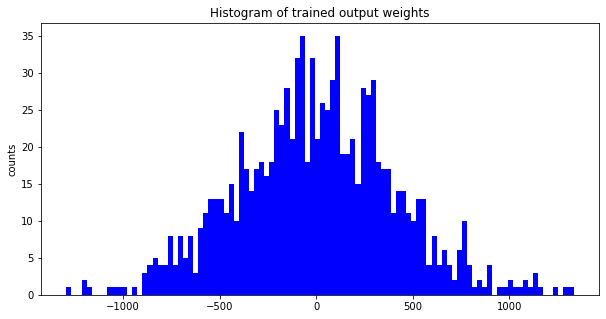


shape of val input (samples, timesteps, features):  (208, 89, 180)
shape of train input (samples, timesteps, features):  (831, 89, 180)

shape of model predictions on validation input (samples, 1):  (208, 1)
shape of val targets (samples, 1):  (208, 1)

train_mae:  0.001
val_mae:  0.3378

train_mse:  0.0
val_mse:  0.1739


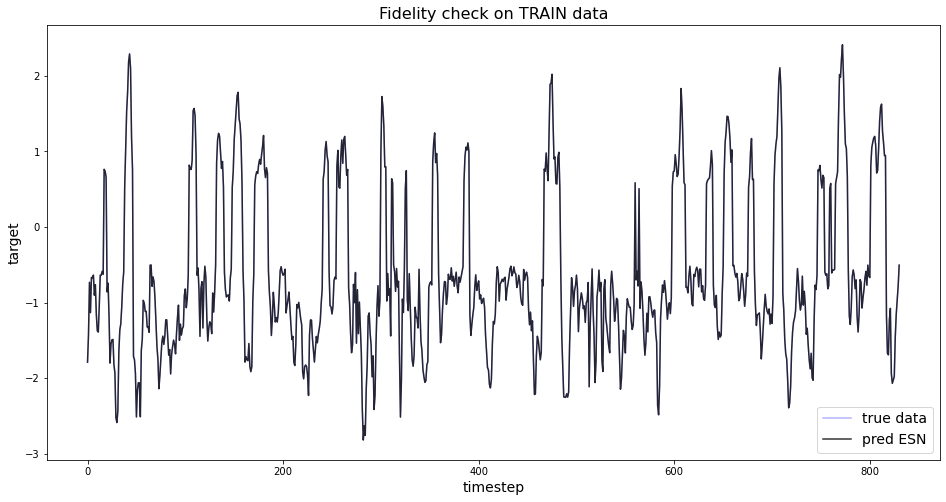

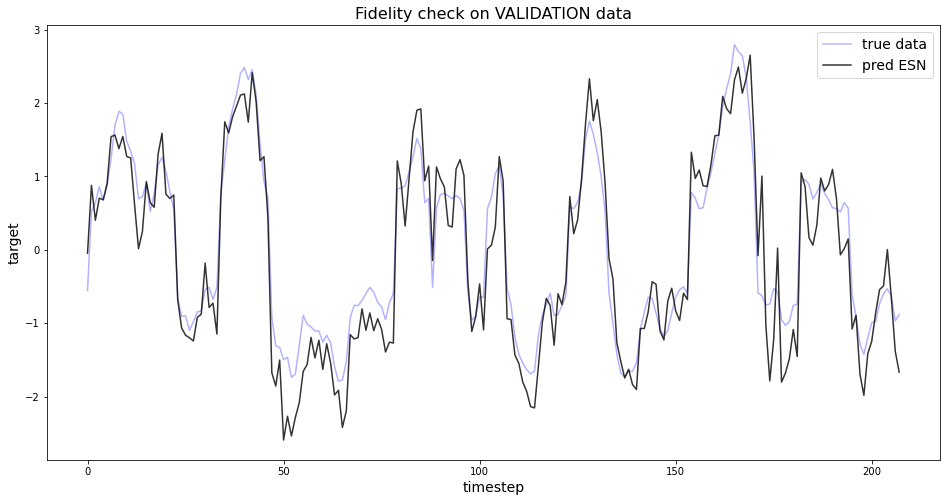

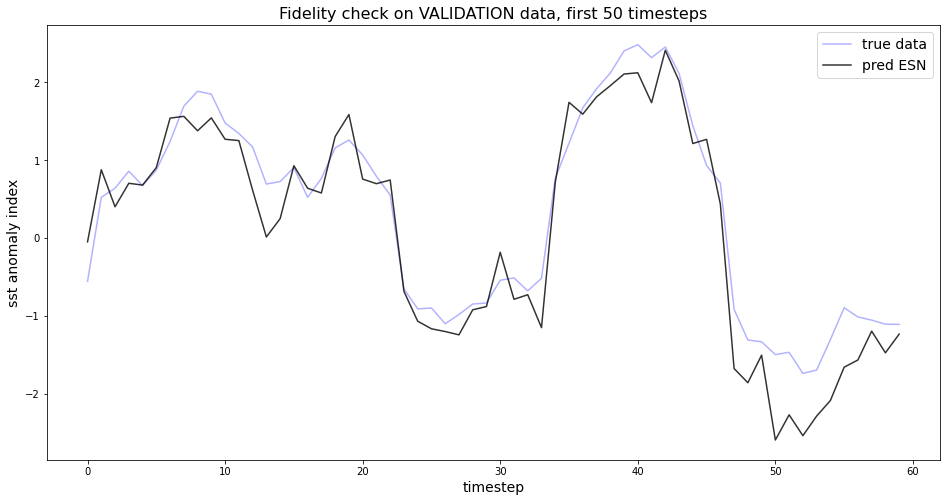

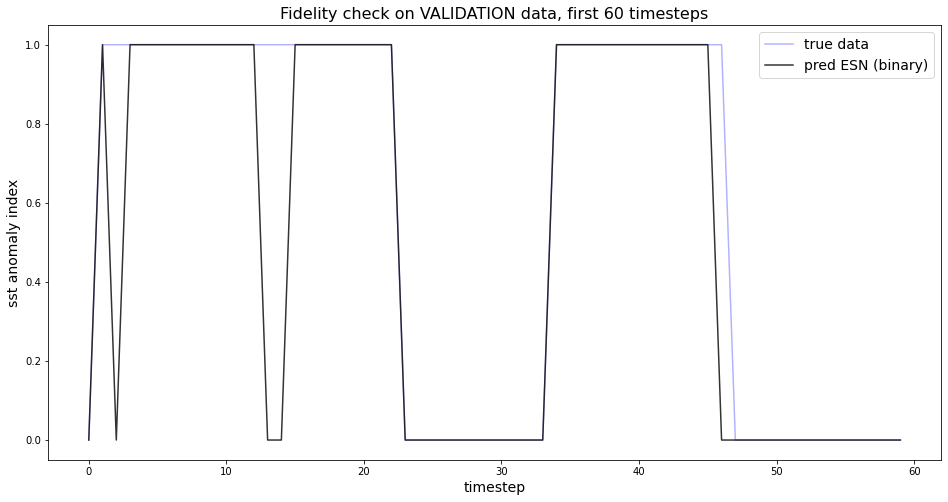


Validation accuracy:
El Nino:  0.81
La Nina:  0.99

Train accuracy:
El Nino:  1.0
La Nina:  1.0


In [192]:
# Get complete model (output = target prediction) plus short model (output final reservoir states from all layers)
# and all_states (= another shortened model that gives reservoir states for ALL timesteps for all inputs).
model, model_short, all_states = setESN(input_length=input_length, n_features=n_features, n_layers=n_layers,
                                        n_res=n_res, W_in_lim=W_in_lim, leak_rate=leak_rate,
                                        leak_rate_first_step_YN=leak_rate_first_step_YN,
                                        activation=activation, spec_radius=spec_radius,
                                        sparsity=sparsity, verbose=verbose)

# Train ESN model's output weights and bias
model = trainESN(model, model_short, train_input, train_target, verbose=verbose)

# Get predictions from trained ESN model and evaluation metrics on model performance:
train_pred, val_pred, train_mae, val_mae, train_mse, val_mse = predESN(model, train_input, val_input,
                                                                       train_target, val_target,
                                                                       verbose=verbose)

if verbose:   
    # Fidelity check: Plot val_pred vs. val_targets, but only the first 60 timesteps
    plt.figure(figsize=(16,8))
    plt.plot(range(len(val_target[:60])),val_target[:60],'b',label="true data", alpha=0.3)
    plt.plot(range(len(val_pred[:60])),val_pred[:60],'k',  alpha=0.8, label='pred ESN')
    plt.title('Fidelity check on VALIDATION data, first 50 timesteps', fontsize=16)
    plt.xlabel('timestep', fontsize=14)
    plt.ylabel('sst anomaly index', fontsize=14)
    plt.legend(fontsize=14)
    plt.show()

# Convert to binary prediction:
train_pred_bin = (train_pred > 0.5)
val_pred_bin = (val_pred > 0.5)

if verbose:
    # Fidelity check for binary prediction and target.
    # Plot val_pred_bin vs. val_targets, but only the first 60 timesteps
    plt.figure(figsize=(16,8))
    plt.plot(range(len(val_target_bin[:60])),val_target_bin[:60],'b',label="true data", alpha=0.3)
    plt.plot(range(len(val_pred_bin[:60])),val_pred_bin[:60],'k',  alpha=0.8, label='pred ESN (binary)')
    plt.title('Fidelity check on VALIDATION data, first 60 timesteps', fontsize=16)
    plt.xlabel('timestep', fontsize=14)
    plt.ylabel('sst anomaly index', fontsize=14)
    plt.legend(fontsize=14)
    plt.show()

## Check accuracy: How often is the correct label predicted?
## Note: Accurate prediction means having a certain event (e.g. El Nino) and correctly predicting 
## to have that same event.

# Get validation accuracy: Rel. amount of correctly predicted events.
val_acc_ElNino = sum((val_pred_bin == val_target_bin) & (val_target_bin == 1)) / sum(val_target_bin == 1)
val_acc_LaNina = sum((val_pred_bin == val_target_bin) & (val_target_bin == 0)) / sum(val_target_bin == 0)

# Get train accuracy: Rel. amount of correctly predicted events.
train_acc_ElNino = sum((train_pred_bin == train_target_bin) & (train_target_bin == 1)) / sum(train_target_bin == 1)
train_acc_LaNina = sum((train_pred_bin == train_target_bin) & (train_target_bin == 0)) / sum(train_target_bin == 0)

if verbose:
    print("\nValidation accuracy:")
    print("El Nino: ", np.round(val_acc_ElNino[0],2))
    print("La Nina: ", np.round(val_acc_LaNina[0],2))

    print("\nTrain accuracy:")
    print("El Nino: ", np.round(train_acc_ElNino[0],2))
    print("La Nina: ", np.round(train_acc_LaNina[0],2))

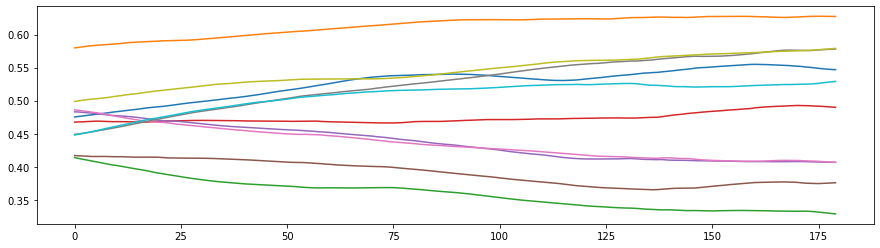

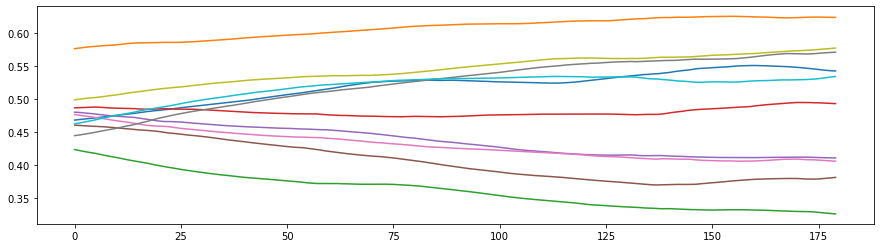

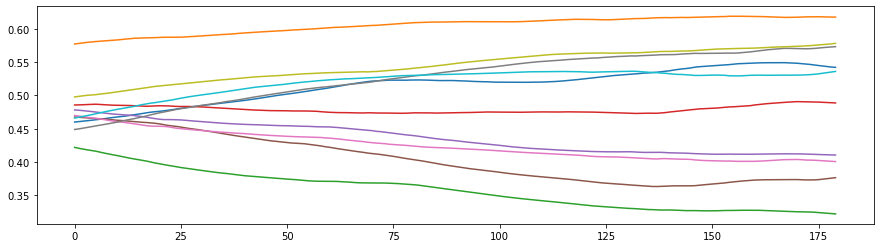

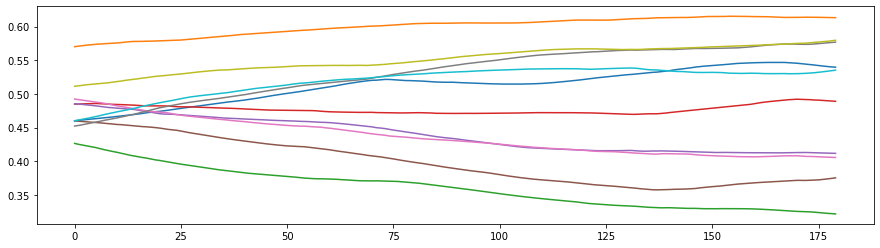

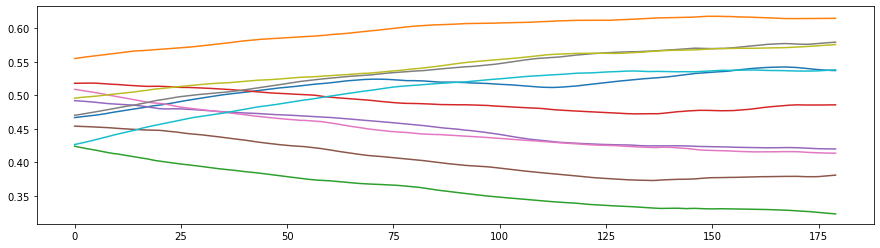

In [179]:
## Investigate convergence of reservoir states:

# Activation = tanh
# leak_rate_first_step_YN = True

# Get all reservoir states for all reservoir units for all timesteps for all train samples:
all_states_train = all_states.predict(train_input)

## Plot states for all timesteps for first 10 reservoir units for first 5 train samples:
for i in range(5):
    plt.figure(figsize=(15, 4))
    plt.plot(all_states_train[i,:,:10])
    plt.show

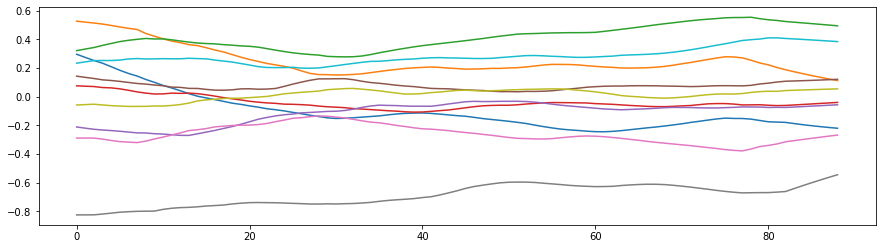

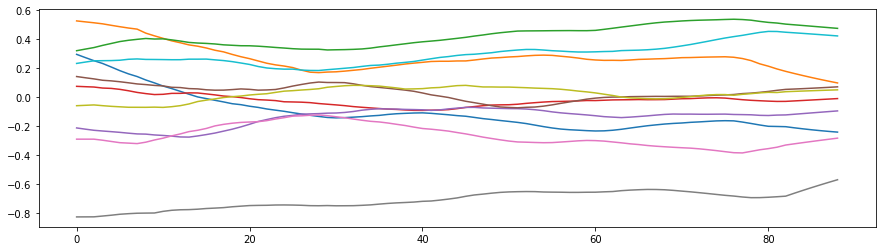

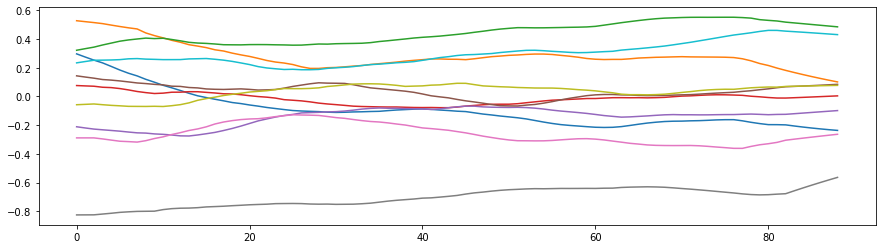

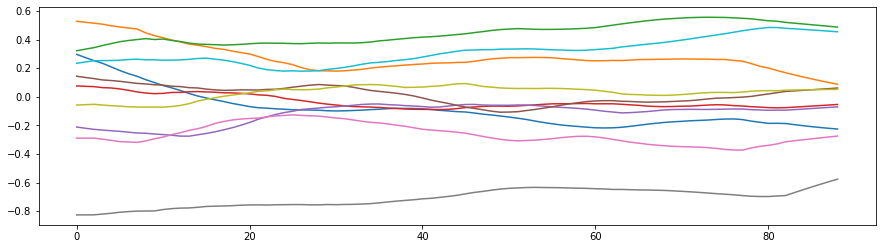

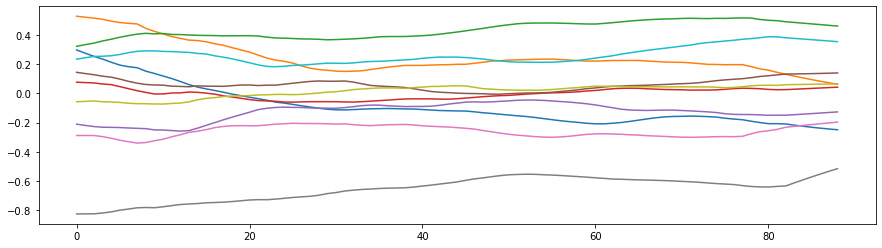

In [86]:
## Investigate convergence of reservoir states:

# Activation = tanh
# leak_rate_first_step_YN = False

# Get all reservoir states for all reservoir units for all timesteps for all train samples:
all_states_train = all_states.predict(train_input)

## Plot states for all timesteps for first 10 reservoir units for first 5 train samples:
for i in range(5):
    plt.figure(figsize=(15, 4))
    plt.plot(all_states_train[i,:,:10])
    plt.show

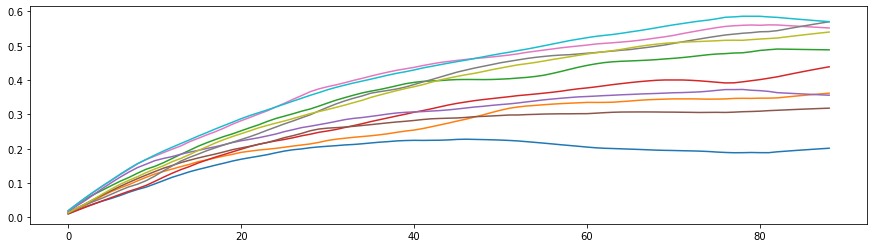

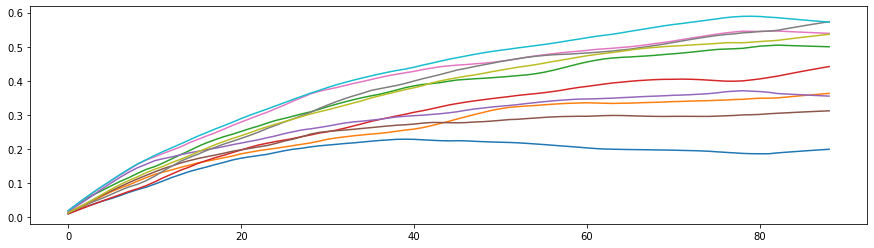

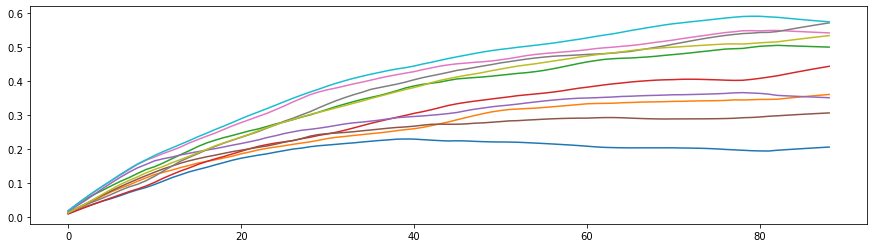

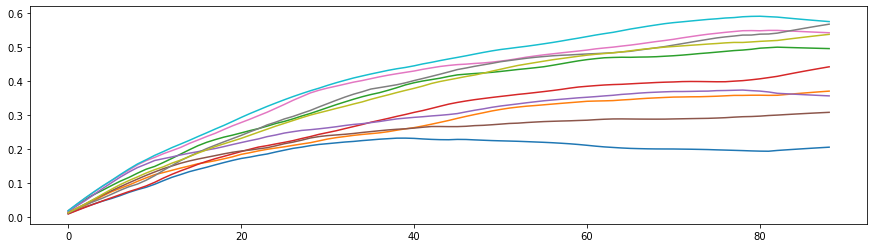

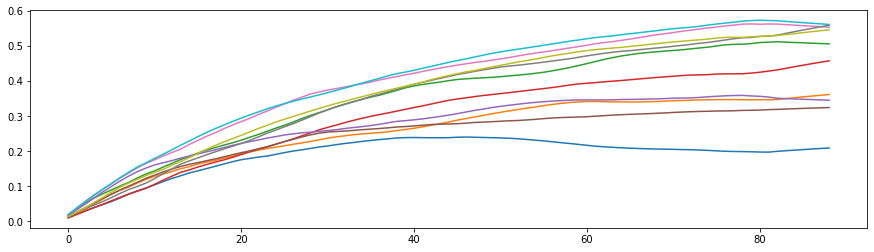

In [83]:
## Investigate convergence of reservoir states:

# Activation = sigmoid
# leak_rate_first_step_YN = True

# Get all reservoir states for all reservoir units for all timesteps for all train samples:
all_states_train = all_states.predict(train_input)

## Plot states for all timesteps for first 10 reservoir units for first 5 train samples:
for i in range(5):
    plt.figure(figsize=(15, 4))
    plt.plot(all_states_train[i,:,:10])
    plt.show

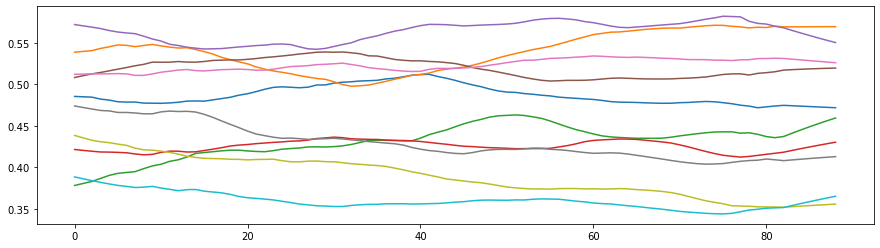

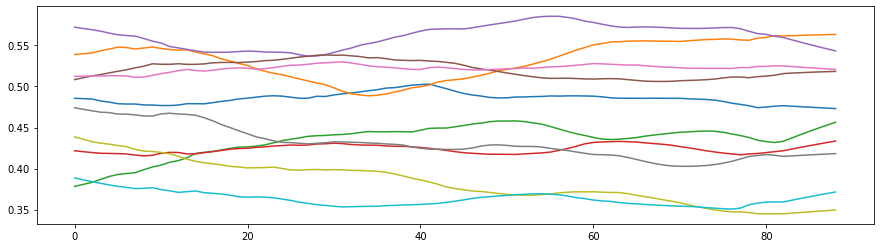

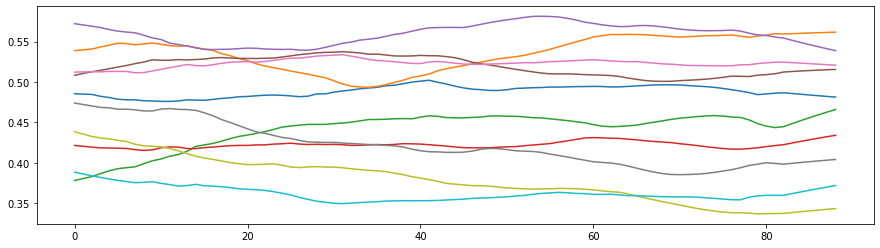

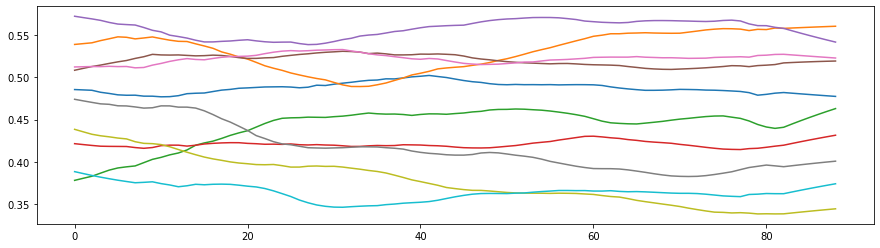

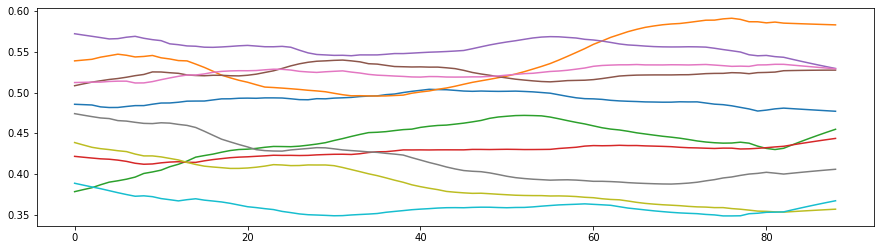

In [80]:
## Investigate convergence of reservoir states:

# Activation = sigmoid
# leak_rate_first_step_YN = False

# Get all reservoir states for all reservoir units for all timesteps for all train samples:
all_states_train = all_states.predict(train_input)

## Plot states for all timesteps for first 10 reservoir units for first 5 train samples:
for i in range(5):
    plt.figure(figsize=(15, 4))
    plt.plot(all_states_train[i,:,:10])
    plt.show

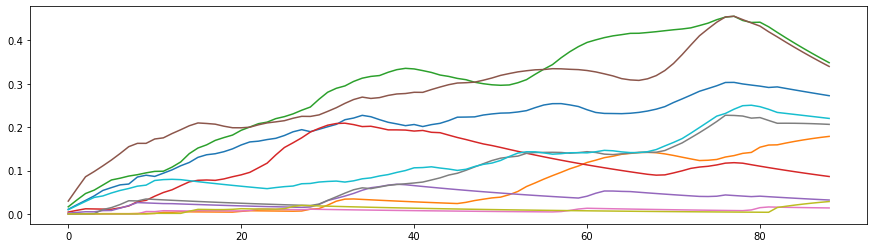

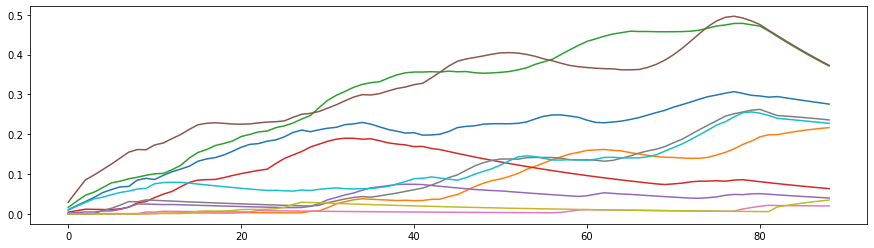

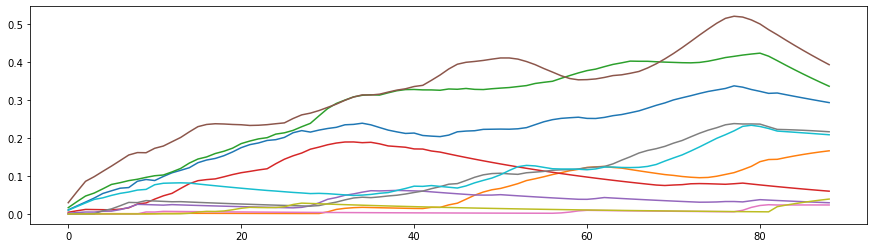

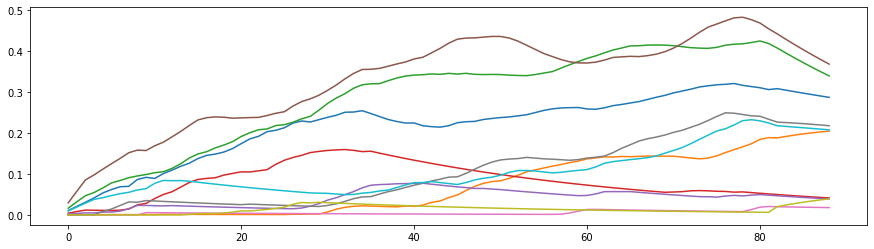

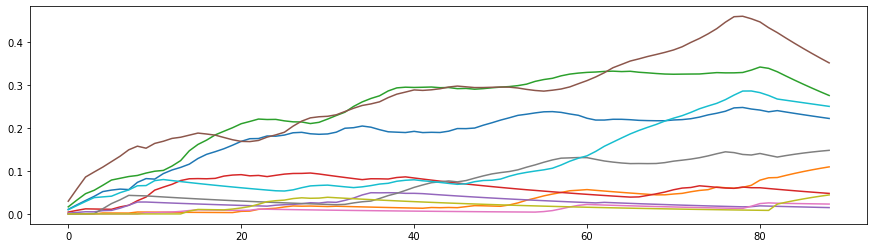

In [77]:
## Investigate convergence of reservoir states:

# Activation = ReLU
# leak_rate_first_step_YN = True

# Get all reservoir states for all reservoir units for all timesteps for all train samples:
all_states_train = all_states.predict(train_input)

## Plot states for all timesteps for first 10 reservoir units for first 5 train samples:
for i in range(5):
    plt.figure(figsize=(15, 4))
    plt.plot(all_states_train[i,:,:10])
    plt.show

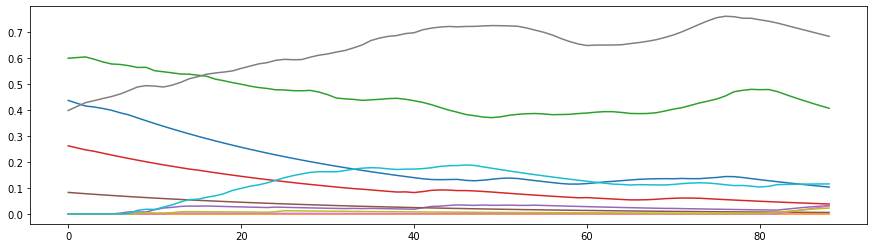

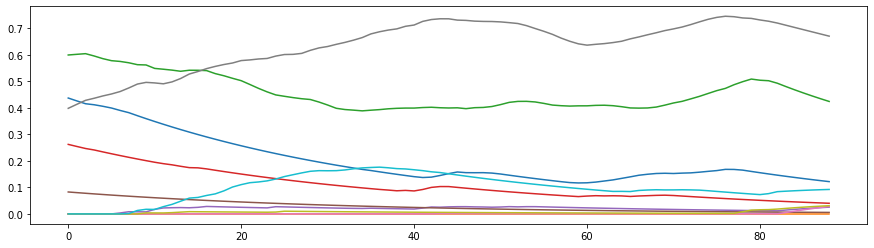

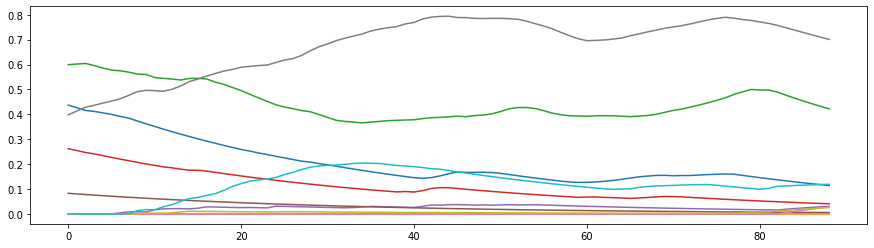

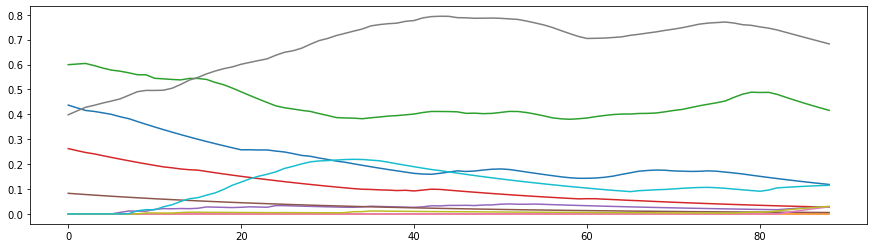

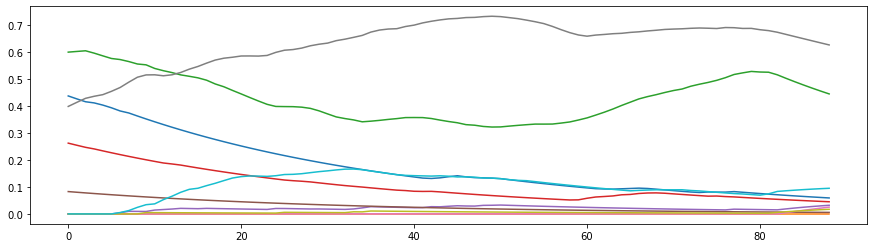

In [74]:
## Investigate convergence of reservoir states:

# Activation = ReLU
# leak_rate_first_step_YN = False

# Get all reservoir states for all reservoir units for all timesteps for all train samples:
all_states_train = all_states.predict(train_input)

## Plot states for all timesteps for first 10 reservoir units for first 5 train samples:
for i in range(5):
    plt.figure(figsize=(15, 4))
    plt.plot(all_states_train[i,:,:10])
    plt.show

### Discussion of convergence of reservoir states

to be filled!

## LRP with baseESN on sst anomaly fields

Start with the following setup, that turned out to yield best results:

* **sigmoid** activation
* **Don't multiply with alpha** in calculating first timestes's res. states (leak_rate_first_step_YN = False)
* **Scale** inputs to [0,1] after **capping** 0.005% on both tails of sst anomaly distribution.
* Optionally work with **zero input and reservoir biases**, but don't observe any effect on resulting relevance map.

First try un-scaled continuous normalized sst anomaly index as target and focus on LRP for **one nice El Nino sample**.

**First approach**: Use the following rule for translating the relevance from layer $j$ to previous layer $i$:

$$R_i = \sum_j \frac{w_{ij}^+}{\sum_i w_{ij}^+}R_j$$

In this approach all bias terms are neglected and we don't take states $a_i$ into account. We find some structure in relevance map but not as expected. Note: Need small leak rate $\alpha$, to have enough relevance backpropagating through reccurent reservoir timesteps!

**Second approach**: Use the following propagation rule to pass information backward from layer $j$ to previous layer $i$:

$$R_i = \sum_j \frac{z_{ij}^+}{\sum_i z_{ij}^+}R_j$$

Here we only take positive contributions of pre-activations $z_{ij}^+ = (a_i w_{ij})^+$ into account. Find some nice and reasonable structure in relevance map, **highlighting Nino region**, as expected.

Sample dimensions and prediction:
raw sample shape (1, timesteps, features):  (1, 89, 180)
number of timesteps:  89
number of input features in_feat:  180
number of res. units n_res:  1000
leak rate alpha:  0.01
model prediction on sample:  2.122
true target for sample:  2.485

Model weights and biases, Dimensions:
input weights W_in (input features, res. units):  (180, 1000)
input biases b_in (res. units):  (1000,)
reservoir weights W_res (res. units, res. units):  (1000, 1000)
reservoir biases b_res (res. units):  (1000,)
output weights W_out (res. units, output features):  (1000, 1)
output biases b_out (output features):  (1,)


/var/folders/jv/p__lpnd50w93ff78f84hkwkh7fs9_f/T/ipykernel_1104/3005859859.py:48: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  model_weights = np.array(model.get_weights())



Tensor shapes:
input tensor U (timesteps, input features):  (89, 180)
all res. states X (timesteps, res. units):  (89, 1000)
activations ACT (timesteps, res. units):  (89, 1000)


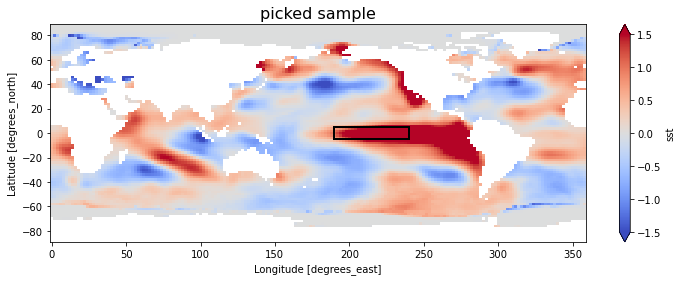

In [193]:
### Pick out ONE El Nino sample to be analysed:
sample_id = 871 # number 40 of validation inputs --> El Nino sample
#sample_id = 883 # number 52 of validation inputs --> La Nina sample
sample = inputs[sample_id:sample_id+1,:]

## If feeding the sample column-wise is desired, need to swap lat <-> lon for input sample:
#sample = np.swapaxes(sample, 1, 2)

# Plot sample input
fig, ax = plt.subplots(figsize=(12, 4))
sst_anomaly_fields_NinoNina[sample_id].name = 'sst anomaly deg Celsius'
sst_anomaly_fields_NinoNina[sample_id].plot(ax=ax, cmap='coolwarm', vmax=1.5, vmin=-1.5)
plt.title('picked sample', fontsize=16)

# Create a Rectangle patch and add the patch to the Axes
rect = patches.Rectangle((190, -5), 50, 10, linewidth=2, edgecolor='black', facecolor='none')
ax.add_patch(rect)

# Extract number of timesteps (timesteps) and variable T to loop over.
# Note: Subtract 1 from absolute number of timesteps to get T, since loops start at 0.
timesteps = sample.shape[1]
T = timesteps - 1

# Extract number of input features:
in_feat = sample.shape[2]

# Rename leak_rate to 'a' for convenience and readability of LRP algorithm:
a = leak_rate

# Have trained model as pre-requisite. Check prediction and target on picked sample:
pred = model.predict(sample)[0,0]
target = targets[sample_id,0]

## Check dimensions and prediction:
print("Sample dimensions and prediction:")
print("=================================")
print("raw sample shape (1, timesteps, features): ", sample.shape)
print("number of timesteps: ", timesteps)
print("number of input features in_feat: ", in_feat)
print("number of res. units n_res: ", n_res)
print("leak rate alpha: ", a)
print("model prediction on sample: ", np.round(pred,3))
print("true target for sample: ", np.round(target,3))

### Extract model weights from trained model:

## Get all weights:
model_weights = np.array(model.get_weights())

## Set input / reservoir / output weights and bias(es):
W_in = model_weights[0]
b_in = model_weights[1]
W_res = model_weights[2]
b_res = model_weights[3]
W_out = model_weights[4]
b_out = model_weights[5]

## Check dimensions:
print("\nModel weights and biases, Dimensions:")
print("=====================================")
print("input weights W_in (input features, res. units): ", W_in.shape)
print("input biases b_in (res. units): ", b_in.shape)
print("reservoir weights W_res (res. units, res. units): ", W_res.shape)
print("reservoir biases b_res (res. units): ", b_res.shape)
print("output weights W_out (res. units, output features): ", W_out.shape)
print("output biases b_out (output features): ", b_out.shape)

## Set tensors for inputs U, activation layer ACT and all reservoir states X:

# Get inputs U for all timesteps from raw input sample by just omitting first dimension (=sample number):
U = sample[0,:,:]

# Get all reservoir states for all timesteps X on picked sample, omit first dimension (=sample number):
X = all_states.predict(sample)[0,:,:]

# Get X' from all reservoir states X, shifted by one timestep and adding ZEROs as first row:
X_prime = np.concatenate([np.zeros((1,n_res)),X[:-1,:]], axis=0)

# Get activation layer ACT from relation: X = (1 - alpha) * X_prime + alpha * ACT
ACT = (X - (1 - a) * X_prime) / a

# Check dimensions:
print("\nTensor shapes:")
print("==============")
print("input tensor U (timesteps, input features): ", U.shape)
print("all res. states X (timesteps, res. units): ", X.shape)
print("activations ACT (timesteps, res. units): ", ACT.shape)

In [151]:
### LRP on baseESN: First attempt, only take positive weights into account.

## Start with layer T

# Get relevances R_i and first part of R_j for n_res units x_i in ACT(T) and x_j in X(T-1), respectively,
# connecting to single OUTPUT unit x_o:
R_i = (a * (W_out[:,0]>0) * W_out[:,0]) / sum((W_out[:,0]>0) * W_out[:,0]) * pred
R_j_1 = ((1 - a) * (W_out[:,0]>0) * W_out[:,0]) / sum((W_out[:,0]>0) * W_out[:,0]) * pred

# Get relevances R_k for in_feat input units x_k of U(T)
R_k = np.sum((W_in>0) * W_in / (np.sum((W_in>0) * W_in, axis=0) + np.sum((W_res>0) * W_res, axis=0)) * R_i, axis=1)

# Get second contribution R_j_2 for relevance R_j for n_res units x_j of X(T-1) connecting to x_i units of ACT(T).
R_j_2 = np.sum((W_res>0) * W_res / (np.sum((W_in>0) * W_in, axis=0) + np.sum((W_res)>0 * W_res, axis=0)) * R_i, axis=1)

# Combine both contributions for relevance R_j, for n_res units x_j of X(T-1):
R_j = R_j_1 + R_j_2

## Store relevance for input layer U for current timestep.
R_all = np.reshape(R_k,(1,len(R_k)))

# Store other relevances for plausibility check:
R_i_sum = []
R_j_sum = []
R_k_sum = []
R_j_1_sum = []
R_j_2_sum = []
R_i_sum.append(sum(R_i))
R_j_sum.append(sum(R_j))
R_k_sum.append(sum(R_k))
R_j_1_sum.append(sum(R_j_1))
R_j_2_sum.append(sum(R_j_2))

### Now loop over remaining T-1 layers in decreasing order. Start with T-1, stop at first layer, since that needs
### special treatment.


for t in np.flip(np.arange(1,T)):
    
    # Get relevances R_i for n_res units x_i of ACT(t). Note: Each unit x_i is only connected to a
    # single corresponding unit x_m of X(t), multiplied by alpha. 
    # No additional weights and bias in this connection, hence w=1 and b=0.
    R_i = a * R_j
    
    # The same holds true for first part of relevances R_j_1 for n_res units x_j of X(t-1) connecting to
    # n_res units x_m of X(t), multiplied by (1-alpha), no weights and bias.
    R_j_1 = (1 - a) * R_j
    
    # Get relevances R_k for in_feat input units x_k of U(T)
    R_k = np.sum((W_in>0) * W_in / (np.sum((W_in>0) * W_in, axis=0)
                                    + np.sum((W_res>0) * W_res, axis=0)) * R_i, axis=1)

    # Get second contribution R_j_2 for relevance R_j for n_res units x_j of X(T-1) connecting to x_i units of ACT(T).
    R_j_2 = np.sum((W_res>0) * W_res / (np.sum((W_in>0) * W_in, axis=0)
                                        + np.sum((W_res>0) * W_res, axis=0)) * R_i, axis=1)
    
    # Combine both contributions for relevance R_j, for n_res units x_j of X(t-1):
    R_j = R_j_1 + R_j_2

    ## Store relevance for input layer U for current timestep.
    R_all = np.concatenate([np.reshape(R_k,(1,len(R_k))), R_all], axis=0)
    
    # Store other relevances for plausibility check:
    R_i_sum.append(sum(R_i))
    R_j_sum.append(sum(R_j))
    R_k_sum.append(sum(R_k))
    R_j_1_sum.append(sum(R_j_1))
    R_j_2_sum.append(sum(R_j_2))

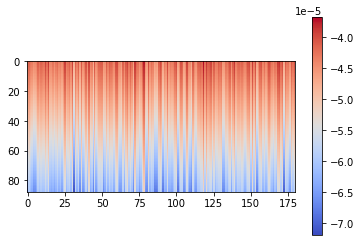

In [152]:
plt.imshow(R_all, cmap='coolwarm', interpolation='nearest')#, vmin=-0.1, vmax=0.1)
plt.colorbar()
plt.show()

In [194]:
### LRP on baseESN: Second attempt, only take positive contributions of pre-potential into account.

## Start with layer T

# Get relevances R_i and first part of R_j for n_res units x_i in ACT(T) and x_j in X(T-1), respectively,
# connecting to single OUTPUT unit x_o:
R_i = (a * (np.multiply(ACT[T,:],W_out[:,0])>0) * np.multiply(ACT[T,:],W_out[:,0]) /
       sum((np.multiply(ACT[T,:],W_out[:,0])>0) * np.multiply(ACT[T,:],W_out[:,0])) * pred)
R_j_1 = ((1 - a) * (np.multiply(ACT[T,:],W_out[:,0])>0) * np.multiply(ACT[T,:],W_out[:,0])
         / sum((np.multiply(ACT[T,:],W_out[:,0])>0) * np.multiply(ACT[T,:],W_out[:,0])) * pred)

# Get relevances R_k for in_feat input units x_k of U(T)
R_k = np.sum((np.multiply(np.reshape(U[T,:],(in_feat,1)),W_in)>0) * np.multiply(np.reshape(U[T,:],(in_feat,1)),W_in)
             / (np.sum((np.multiply(np.reshape(U[T,:],(in_feat,1)),W_in)>0) * np.multiply(np.reshape(U[T,:],(in_feat,1)),W_in), axis=0)
                + np.sum((np.multiply(np.reshape(X[T-1,:],(n_res, 1)),W_res)>0) * np.multiply(np.reshape(X[T-1,:],(n_res, 1)),W_res), axis=0)) * R_i, axis=1)

# Get second contribution R_j_2 for relevance R_j for n_res units x_j of X(T-1) connecting to x_i units of ACT(T).
R_j_2 = np.sum((np.multiply(np.reshape(X[T-1,:],(n_res, 1)),W_res)>0) * np.multiply(np.reshape(X[T-1,:],(n_res, 1)),W_res)
/ (np.sum((np.multiply(np.reshape(U[T,:],(in_feat,1)),W_in)>0) * np.multiply(np.reshape(U[T,:],(in_feat,1)),W_in), axis=0)
                + np.sum((np.multiply(np.reshape(X[T-1,:],(n_res, 1)),W_res)>0) * np.multiply(np.reshape(X[T-1,:],(n_res, 1)),W_res), axis=0)) * R_i, axis=1)

# Combine both contributions for relevance R_j, for n_res units x_j of X(T-1):
R_j = R_j_1 + R_j_2

## Store relevance for input layer U for current timestep.
R_all = np.reshape(R_k,(1,len(R_k)))

# Store other relevances for plausibility check:
R_i_sum = []
R_j_sum = []
R_k_sum = []
R_j_1_sum = []
R_j_2_sum = []
R_i_sum.append(sum(R_i))
R_j_sum.append(sum(R_j))
R_k_sum.append(sum(R_k))
R_j_1_sum.append(sum(R_j_1))
R_j_2_sum.append(sum(R_j_2))

### Now loop over remaining T-1 layers in decreasing order. Start with T-1, stop at first layer, since that needs
### special treatment.


for t in np.flip(np.arange(1,T)):
    
    # Get relevances R_i for n_res units x_i of ACT(t). Note: Each unit x_i is only connected to a
    # single corresponding unit x_m of X(t), multiplied by alpha. 
    # No additional weights and bias in this connection, hence w=1 and b=0.
    R_i = a * R_j
    
    # The same holds true for first part of relevances R_j_1 for n_res units x_j of X(t-1) connecting to
    # n_res units x_m of X(t), multiplied by (1-alpha), no weights and bias.
    R_j_1 = (1 - a) * R_j
    
    # Get relevances R_k for in_feat input units x_k of U(T)
    R_k = np.sum((np.multiply(np.reshape(U[t,:],(in_feat,1)),W_in)>0) * np.multiply(np.reshape(U[t,:],(in_feat,1)),W_in)
                 / (np.sum((np.multiply(np.reshape(U[t,:],(in_feat,1)),W_in)>0) * np.multiply(np.reshape(U[t,:],(in_feat,1)),W_in), axis=0)
                    + np.sum((np.multiply(np.reshape(X[t-1,:],(n_res, 1)),W_res)>0) * np.multiply(np.reshape(X[t-1,:],(n_res, 1)),W_res), axis=0)) * R_i, axis=1)

    # Get second contribution R_j_2 for relevance R_j for n_res units x_j of X(T-1) connecting to x_i units of ACT(T).
    R_j_2 = np.sum((np.multiply(np.reshape(X[t-1,:],(n_res, 1)),W_res)>0) * np.multiply(np.reshape(X[t-1,:],(n_res, 1)),W_res)
    / (np.sum((np.multiply(np.reshape(U[t,:],(in_feat,1)),W_in)>0) * np.multiply(np.reshape(U[t,:],(in_feat,1)),W_in), axis=0)
                    + np.sum((np.multiply(np.reshape(X[t-1,:],(n_res, 1)),W_res)>0) * np.multiply(np.reshape(X[t-1,:],(n_res, 1)),W_res), axis=0)) * R_i, axis=1)
    
    # Combine both contributions for relevance R_j, for n_res units x_j of X(t-1):
    R_j = R_j_1 + R_j_2

    ## Store relevance for input layer U for current timestep.
    R_all = np.concatenate([np.reshape(R_k,(1,len(R_k))), R_all], axis=0)
    
    # Store other relevances for plausibility check:
    R_i_sum.append(sum(R_i))
    R_j_sum.append(sum(R_j))
    R_k_sum.append(sum(R_k))
    R_j_1_sum.append(sum(R_j_1))
    R_j_2_sum.append(sum(R_j_2))

In [188]:
## If worked with swapped sample (lat <-> lon), reverse swapping:
R_all = np.swapaxes(R_all, 0, 1)

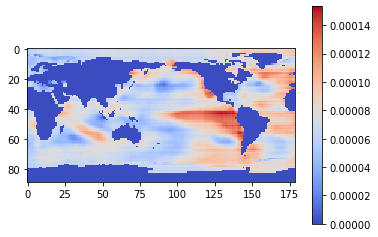

In [189]:
plt.imshow(R_all, cmap='coolwarm', interpolation='nearest')#, vmin=-0.1, vmax=0.1)
plt.colorbar()
plt.show()

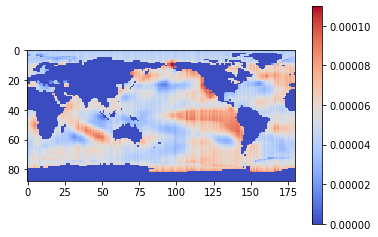

In [195]:
plt.imshow(R_all, cmap='coolwarm', interpolation='nearest')#, vmin=-0.1, vmax=0.1)
plt.colorbar()
plt.show()

### Discussion: LRP with baseESN on sst anomaly fields

Considering only positive weights for backpropagating relevance is not sufficient. But find second approach with considering **positive pre-activations** for backpropagating relevance to yield nice structure in resulting relevance map. **Capping** sst anomaly fields' values to only work with values inside some specified quantile limits **is essentiel**, to enable reasonable scaling of inputs!

#### Artefacts / stripes in relevance map

See some stripes in single relevance map. Idee: Compute mean relevance map for e.g. all El Nino samples. Still observe artefacts in terms of stripes when looking at **one baseESN model's** mean relevance map. However, averaging mean relevance maps for multiple baseESN models let's stipes dissapear!

#### Reducing artefacts

Another efficient way of reducing stripes in relevance maps is **increasing number of reservoir units** from $n_{res}=300$ to $1000$, and slightly increasing sparsity from $0.2$ to $0.3$. Find nice smoothed relevance map already for single El Nino sample. And even better when computing **mean relevance map** for all El Nino samples (train samples) for just **one baseESN** model.

#### Feeding inputs column-wise

Swapping lat and lon for input samples, we can **feed inputs column-wise** into base ESN. That leeds to very smooth relevance maps! Train and validation accuracy shows no significant decline compared to feeding inputs row-wise inte the model.

#### Relevance for La Nina samples

So far we only focussed on producing relevance map for single (or all) El Nino sample(s). Now switch to binary target and try to find relevance map not only for El Nino sample (target = 1), but also for La Nina sample (target = 0), by looking for **positive contributions of pre-potentials** and **negative contributions**, respectively.

(If that's already found to work, don't need to switch to **one-hot** target.)

### LRP with baseESN on binary target

In [197]:
### LRP on baseESN: Second attempt ADJUSTED, only take NEGATIVE contributions of pre-potential into account.
### NOTE: Need NEGATIVE prediction (at least for La Nina samples), 
###       since we work with continuous sst anomaly index as target.

## Start with layer T

# Get relevances R_i and first part of R_j for n_res units x_i in ACT(T) and x_j in X(T-1), respectively,
# connecting to single OUTPUT unit x_o:
R_i = (a * (np.multiply(ACT[T,:],W_out[:,0])<0) * np.multiply(ACT[T,:],W_out[:,0]) /
       sum((np.multiply(ACT[T,:],W_out[:,0])<0) * np.multiply(ACT[T,:],W_out[:,0])) * -pred)
R_j_1 = ((1 - a) * (np.multiply(ACT[T,:],W_out[:,0])<0) * np.multiply(ACT[T,:],W_out[:,0])
         / sum((np.multiply(ACT[T,:],W_out[:,0])<0) * np.multiply(ACT[T,:],W_out[:,0])) * -pred)

# Get relevances R_k for in_feat input units x_k of U(T)
R_k = np.sum((np.multiply(np.reshape(U[T,:],(in_feat,1)),W_in)<0) * np.multiply(np.reshape(U[T,:],(in_feat,1)),W_in)
             / (np.sum((np.multiply(np.reshape(U[T,:],(in_feat,1)),W_in)<0) * np.multiply(np.reshape(U[T,:],(in_feat,1)),W_in), axis=0)
                + np.sum((np.multiply(np.reshape(X[T-1,:],(n_res, 1)),W_res)<0) * np.multiply(np.reshape(X[T-1,:],(n_res, 1)),W_res), axis=0)) * R_i, axis=1)

# Get second contribution R_j_2 for relevance R_j for n_res units x_j of X(T-1) connecting to x_i units of ACT(T).
R_j_2 = np.sum((np.multiply(np.reshape(X[T-1,:],(n_res, 1)),W_res)<0) * np.multiply(np.reshape(X[T-1,:],(n_res, 1)),W_res)
/ (np.sum((np.multiply(np.reshape(U[T,:],(in_feat,1)),W_in)<0) * np.multiply(np.reshape(U[T,:],(in_feat,1)),W_in), axis=0)
                + np.sum((np.multiply(np.reshape(X[T-1,:],(n_res, 1)),W_res)<0) * np.multiply(np.reshape(X[T-1,:],(n_res, 1)),W_res), axis=0)) * R_i, axis=1)

# Combine both contributions for relevance R_j, for n_res units x_j of X(T-1):
R_j = R_j_1 + R_j_2

## Store relevance for input layer U for current timestep.
R_all = np.reshape(R_k,(1,len(R_k)))

# Store other relevances for plausibility check:
R_i_sum = []
R_j_sum = []
R_k_sum = []
R_j_1_sum = []
R_j_2_sum = []
R_i_sum.append(sum(R_i))
R_j_sum.append(sum(R_j))
R_k_sum.append(sum(R_k))
R_j_1_sum.append(sum(R_j_1))
R_j_2_sum.append(sum(R_j_2))

### Now loop over remaining T-1 layers in decreasing order. Start with T-1, stop at first layer, since that needs
### special treatment.


for t in np.flip(np.arange(1,T)):
    
    # Get relevances R_i for n_res units x_i of ACT(t). Note: Each unit x_i is only connected to a
    # single corresponding unit x_m of X(t), multiplied by alpha. 
    # No additional weights and bias in this connection, hence w=1 and b=0.
    R_i = a * R_j
    
    # The same holds true for first part of relevances R_j_1 for n_res units x_j of X(t-1) connecting to
    # n_res units x_m of X(t), multiplied by (1-alpha), no weights and bias.
    R_j_1 = (1 - a) * R_j
    
    # Get relevances R_k for in_feat input units x_k of U(T)
    R_k = np.sum((np.multiply(np.reshape(U[t,:],(in_feat,1)),W_in)<0) * np.multiply(np.reshape(U[t,:],(in_feat,1)),W_in)
                 / (np.sum((np.multiply(np.reshape(U[t,:],(in_feat,1)),W_in)<0) * np.multiply(np.reshape(U[t,:],(in_feat,1)),W_in), axis=0)
                    + np.sum((np.multiply(np.reshape(X[t-1,:],(n_res, 1)),W_res)<0) * np.multiply(np.reshape(X[t-1,:],(n_res, 1)),W_res), axis=0)) * R_i, axis=1)

    # Get second contribution R_j_2 for relevance R_j for n_res units x_j of X(T-1) connecting to x_i units of ACT(T).
    R_j_2 = np.sum((np.multiply(np.reshape(X[t-1,:],(n_res, 1)),W_res)<0) * np.multiply(np.reshape(X[t-1,:],(n_res, 1)),W_res)
    / (np.sum((np.multiply(np.reshape(U[t,:],(in_feat,1)),W_in)<0) * np.multiply(np.reshape(U[t,:],(in_feat,1)),W_in), axis=0)
                    + np.sum((np.multiply(np.reshape(X[t-1,:],(n_res, 1)),W_res)<0) * np.multiply(np.reshape(X[t-1,:],(n_res, 1)),W_res), axis=0)) * R_i, axis=1)
    
    # Combine both contributions for relevance R_j, for n_res units x_j of X(t-1):
    R_j = R_j_1 + R_j_2

    ## Store relevance for input layer U for current timestep.
    R_all = np.concatenate([np.reshape(R_k,(1,len(R_k))), R_all], axis=0)
    
    # Store other relevances for plausibility check:
    R_i_sum.append(sum(R_i))
    R_j_sum.append(sum(R_j))
    R_k_sum.append(sum(R_k))
    R_j_1_sum.append(sum(R_j_1))
    R_j_2_sum.append(sum(R_j_2))

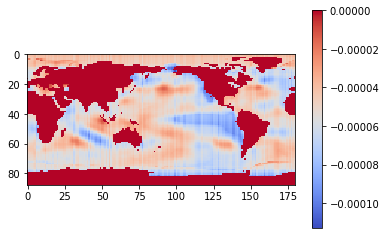

In [198]:
plt.imshow(R_all, cmap='coolwarm', interpolation='nearest')#, vmin=-0.1, vmax=0.1)
plt.colorbar()
plt.show()

In [112]:
R_all_copy = np.copy(R_all)

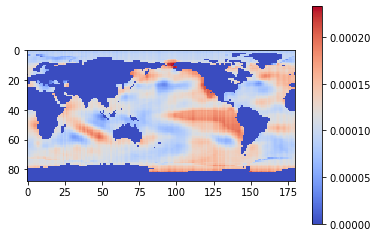

In [115]:
plt.imshow(R_all_copy + R_all, cmap='coolwarm', interpolation='nearest')#, vmin=-0.1, vmax=0.1)
plt.colorbar()
plt.show()

### Classification with baseESN on one-hot targets


#### Base parameter setup

In the first part of this experiment (**--> ESN_exp08_LRP.ipynb**) we found (slightly) modified optimal parameters four our baseESN model. Then found that increases number of reservoir units and sparsity enhances quality of resulting relevance maps in terms of less artefacts (=stripes):

* n_res = 1000
* W_in_lim = 0.1
* leak_rate = 0.1
* spec_radius = 0.8
* sparsity = 0.3

So far we have been using these parameters on capped sst anomaly fields - scaled to [0,1] as inputs and unscaled continuous normalized sst anomaly index as target, together with **sigmoid** activation we can get models with accuracy 100% on La Nina and 94% on El Nino, for both, train and validation samples. Multiplication with $\alpha$ is omitted in calculating first timestes's reservoir states (*leak_rate_first_step_YN = False*).

#### Switch to one-hot targets

We now switch to having two output units and train output weights on **one-hot targets**. Still use linear regression, since there exists no obvious closed-form solution for *logistic regression*.
**--> ESN_exp08_LRP_Part4.ipynb**

### Get mean relevance maps for ALL El Nino samples

In [103]:
### LRP with baseESN on ALL El Nino / La Nina samples (from train inputs)

verbose=False

## Split train inputs into El Nino / La Nina samples, according to binary target:
samples_ElNino = train_input[(train_target_bin==1)[:,0]]
samples_LaNina = train_input[(train_target_bin==0)[:,0]]

## Split targets accordingly:
targets_ElNino = train_target[(train_target_bin==1)[:,0]]

if verbose:
    print("samples_ElNino shape: ", samples_ElNino.shape)
    print("samples_LaNina shape: ", samples_LaNina.shape)

# Extract number of timesteps (timesteps) and variable T to loop over.
# Note: Subtract 1 from absolute number of timesteps to get T, since loops start at 0.
timesteps = samples_ElNino.shape[1]
T = timesteps - 1

# Extract number of input features:
in_feat = samples_ElNino.shape[2]

# Rename leak_rate to 'a' for convenience and readability of LRP algorithm:
a = leak_rate

### Extract model weights from trained model:

## Get all weights:
model_weights = np.array(model.get_weights())

## Set input / reservoir / output weights and bias(es):
W_in = model_weights[0]
b_in = model_weights[1]
W_res = model_weights[2]
b_res = model_weights[3]
W_out = model_weights[4]
b_out = model_weights[5]

if verbose:
    ## Check dimensions:
    print("\nModel weights and biases, Dimensions:")
    print("=====================================")
    print("input weights W_in (input features, res. units): ", W_in.shape)
    print("input biases b_in (res. units): ", b_in.shape)
    print("reservoir weights W_res (res. units, res. units): ", W_res.shape)
    print("reservoir biases b_res (res. units): ", b_res.shape)
    print("output weights W_out (res. units, output features): ", W_out.shape)
    print("output biases b_out (output features): ", b_out.shape)

## Initialize storage for mean relevance over all ElNino samples.
## Note: First timestep is still missing in algorithm.
R_all_mean = np.zeros((T, in_feat))
    
#Loop over El Nino samples:
for sample_id in range(len(samples_ElNino)):
    
    # Print status:
    print ("sample: ", sample_id+1, " from ", len(samples_ElNino))
    
    # Get current sample:
    sample = samples_ElNino[sample_id:sample_id+1]
    
    # Have trained model as pre-requisite. Check prediction and target on picked sample:
    pred = model.predict(sample)[0,0]
    target = targets_ElNino[sample_id,0]
    
    if verbose:
        ## Check dimensions and prediction:
        print("Sample dimensions and prediction:")
        print("=================================")
        print("raw sample shape (1, timesteps, features): ", sample.shape)
        print("number of timesteps: ", timesteps)
        print("number of input features in_feat: ", in_feat)
        print("number of res. units n_res: ", n_res)
        print("leak rate alpha: ", a)
        print("model prediction on sample: ", np.round(pred,3))
        print("true target for sample: ", np.round(target,3))



    ## Set tensors for inputs U, activation layer ACT and all reservoir states X:

    # Get inputs U for all timesteps from raw input sample by just omitting first dimension (=sample number):
    U = sample[0,:,:]

    # Get all reservoir states for all timesteps X on picked sample, omit first dimension (=sample number):
    X = all_states.predict(sample)[0,:,:]

    # Get X' from all reservoir states X, shifted by one timestep and adding ZEROs as first row:
    X_prime = np.concatenate([np.zeros((1,n_res)),X[:-1,:]], axis=0)

    # Get activation layer ACT from relation: X = (1 - alpha) * X_prime + alpha * ACT
    ACT = (X - (1 - a) * X_prime) / a
    
    if verbose:
        # Check dimensions:
        print("\nTensor shapes:")
        print("==============")
        print("input tensor U (timesteps, input features): ", U.shape)
        print("all res. states X (timesteps, res. units): ", X.shape)
        print("activations ACT (timesteps, res. units): ", ACT.shape)
        
    ### LRP on baseESN: Second attempt, only consider positive contributions of pre-potential into account.

    ## Start with layer T

    # Get relevances R_i and first part of R_j for n_res units x_i in ACT(T) and x_j in X(T-1), respectively,
    # connecting to single OUTPUT unit x_o:
    R_i = (a * (np.multiply(ACT[T,:],W_out[:,0])>0) * np.multiply(ACT[T,:],W_out[:,0]) /
           sum((np.multiply(ACT[T,:],W_out[:,0])>0) * np.multiply(ACT[T,:],W_out[:,0])) * pred)
    R_j_1 = ((1 - a) * (np.multiply(ACT[T,:],W_out[:,0])>0) * np.multiply(ACT[T,:],W_out[:,0])
             / sum((np.multiply(ACT[T,:],W_out[:,0])>0) * np.multiply(ACT[T,:],W_out[:,0])) * pred)

    # Get relevances R_k for in_feat input units x_k of U(T)
    R_k = np.sum((np.multiply(np.reshape(U[T,:],(in_feat,1)),W_in)>0) * np.multiply(np.reshape(U[T,:],(in_feat,1)),W_in)
                 / (np.sum((np.multiply(np.reshape(U[T,:],(in_feat,1)),W_in)>0) * np.multiply(np.reshape(U[T,:],(in_feat,1)),W_in), axis=0)
                    + np.sum((np.multiply(np.reshape(X[T-1,:],(n_res, 1)),W_res)>0) * np.multiply(np.reshape(X[T-1,:],(n_res, 1)),W_res), axis=0)) * R_i, axis=1)

    # Get second contribution R_j_2 for relevance R_j for n_res units x_j of X(T-1) connecting to x_i units of ACT(T).
    R_j_2 = np.sum((np.multiply(np.reshape(X[T-1,:],(n_res, 1)),W_res)>0) * np.multiply(np.reshape(X[T-1,:],(n_res, 1)),W_res)
    / (np.sum((np.multiply(np.reshape(U[T,:],(in_feat,1)),W_in)>0) * np.multiply(np.reshape(U[T,:],(in_feat,1)),W_in), axis=0)
                    + np.sum((np.multiply(np.reshape(X[T-1,:],(n_res, 1)),W_res)>0) * np.multiply(np.reshape(X[T-1,:],(n_res, 1)),W_res), axis=0)) * R_i, axis=1)

    # Combine both contributions for relevance R_j, for n_res units x_j of X(T-1):
    R_j = R_j_1 + R_j_2

    ## Store relevance for input layer U for current timestep.
    R_all = np.reshape(R_k,(1,len(R_k)))

    ### Now loop over remaining T-1 layers in decreasing order. Start with T-1, stop at first layer, since that needs
    ### special treatment.


    for t in np.flip(np.arange(1,T)):

        # Get relevances R_i for n_res units x_i of ACT(t). Note: Each unit x_i is only connected to a
        # single corresponding unit x_m of X(t), multiplied by alpha. 
        # No additional weights and bias in this connection, hence w=1 and b=0.
        R_i = a * R_j

        # The same holds true for first part of relevances R_j_1 for n_res units x_j of X(t-1) connecting to
        # n_res units x_m of X(t), multiplied by (1-alpha), no weights and bias.
        R_j_1 = (1 - a) * R_j

        # Get relevances R_k for in_feat input units x_k of U(T)
        R_k = np.sum((np.multiply(np.reshape(U[t,:],(in_feat,1)),W_in)>0) * np.multiply(np.reshape(U[t,:],(in_feat,1)),W_in)
                     / (np.sum((np.multiply(np.reshape(U[t,:],(in_feat,1)),W_in)>0) * np.multiply(np.reshape(U[t,:],(in_feat,1)),W_in), axis=0)
                        + np.sum((np.multiply(np.reshape(X[t-1,:],(n_res, 1)),W_res)>0) * np.multiply(np.reshape(X[t-1,:],(n_res, 1)),W_res), axis=0)) * R_i, axis=1)

        # Get second contribution R_j_2 for relevance R_j for n_res units x_j of X(T-1) connecting to x_i units of ACT(T).
        R_j_2 = np.sum((np.multiply(np.reshape(X[t-1,:],(n_res, 1)),W_res)>0) * np.multiply(np.reshape(X[t-1,:],(n_res, 1)),W_res)
        / (np.sum((np.multiply(np.reshape(U[t,:],(in_feat,1)),W_in)>0) * np.multiply(np.reshape(U[t,:],(in_feat,1)),W_in), axis=0)
                        + np.sum((np.multiply(np.reshape(X[t-1,:],(n_res, 1)),W_res)>0) * np.multiply(np.reshape(X[t-1,:],(n_res, 1)),W_res), axis=0)) * R_i, axis=1)

        # Combine both contributions for relevance R_j, for n_res units x_j of X(t-1):
        R_j = R_j_1 + R_j_2

        ## Store relevance for input layer U for current timestep.
        R_all = np.concatenate([np.reshape(R_k,(1,len(R_k))), R_all], axis=0)
        
    ## Add relevance for current sample to storage for ALL samples:
    R_all_mean += R_all

## Get mean relevance over ALL samples:
R_all_mean = R_all_mean / len(samples_ElNino)

/var/folders/jv/p__lpnd50w93ff78f84hkwkh7fs9_f/T/ipykernel_1104/2915916336.py:30: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  model_weights = np.array(model.get_weights())


sample:  1  from  195
sample:  2  from  195
sample:  3  from  195
sample:  4  from  195
sample:  5  from  195
sample:  6  from  195
sample:  7  from  195
sample:  8  from  195
sample:  9  from  195
sample:  10  from  195
sample:  11  from  195
sample:  12  from  195
sample:  13  from  195
sample:  14  from  195
sample:  15  from  195
sample:  16  from  195
sample:  17  from  195
sample:  18  from  195
sample:  19  from  195
sample:  20  from  195
sample:  21  from  195
sample:  22  from  195
sample:  23  from  195
sample:  24  from  195
sample:  25  from  195
sample:  26  from  195
sample:  27  from  195
sample:  28  from  195
sample:  29  from  195
sample:  30  from  195
sample:  31  from  195
sample:  32  from  195
sample:  33  from  195
sample:  34  from  195
sample:  35  from  195
sample:  36  from  195
sample:  37  from  195
sample:  38  from  195
sample:  39  from  195
sample:  40  from  195
sample:  41  from  195
sample:  42  from  195
sample:  43  from  195
sample:  44  from  1

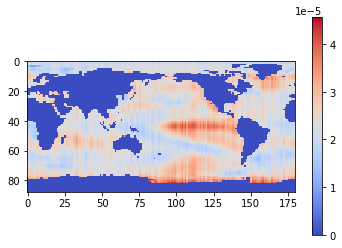

In [104]:
plt.imshow(R_all_mean, cmap='coolwarm', interpolation='nearest')#, vmin=-0.1, vmax=0.1)
plt.colorbar()
plt.show()

In [22]:
R_all_mean_copy = np.copy(R_all_mean)

In [36]:
R_all_temp = R_all_mean_copy + R_all_mean

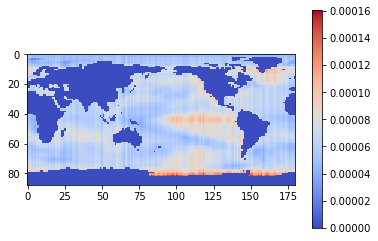

In [37]:
plt.imshow(R_all_temp, cmap='coolwarm', interpolation='nearest')#, vmin=-0.1, vmax=0.1)
plt.colorbar()
plt.show()